In [1]:
library(tidyverse)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [4]:
housing_data <- read_csv("data/HouseListings-Top45Cities-10292023-kaggle.csv")

Rows: 35768 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): City, Address, Province
dbl (7): Price, Number_Beds, Number_Baths, Population, Latitude, Longitude, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [5]:
spec(housing_data)


cols(
  City = col_character(),
  Price = col_double(),
  Address = col_character(),
  Number_Beds = col_double(),
  Number_Baths = col_double(),
  Province = col_character(),
  Population = col_double(),
  Latitude = col_double(),
  Longitude = col_double(),
  Median_Family_Income = col_double()
)

In [38]:
summary_data_city <- housing_data |>
  group_by(City) |>
  summarize(avg_price = mean(Price, na.rm = TRUE))

summary_data_city

City,avg_price
<chr>,<dbl>
Abbotsford,1337250.6
Airdrie,735905.4
Barrie,1048262.8
Brantford,955923.4
Burnaby,1329514.2
Caledon,1383365.9
Calgary,660046.4
Edmonton,425582.0
Guelph,1064623.1


In [42]:
merged_data_city <- left_join(housing_data, summary_data, by = "City")
merged_data_city

City,Price,Address,Number_Beds,Number_Baths,Province,Population,Latitude,Longitude,Median_Family_Income,avg_price
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Toronto,779900,#318 -20 SOUTHPORT ST,3,2,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,799999,#818 -60 SOUTHPORT ST,3,1,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,799900,#714 -859 THE QUEENSWAY,2,2,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,1200000,275 MORTIMER AVE,4,2,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,668800,#420 -388 RICHMOND ST,1,1,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,548000,#2503 -99 HARBOUR SQ,0,1,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,669900,#817 -151 DAN LECKIE WAY,2,1,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,699000,#1107 -438 KING ST W,2,2,Ontario,5647656,43.7417,-79.3733,97000,1235289
Toronto,978000,#2708 -20 EDWARD ST,3,2,Ontario,5647656,43.7417,-79.3733,97000,1235289


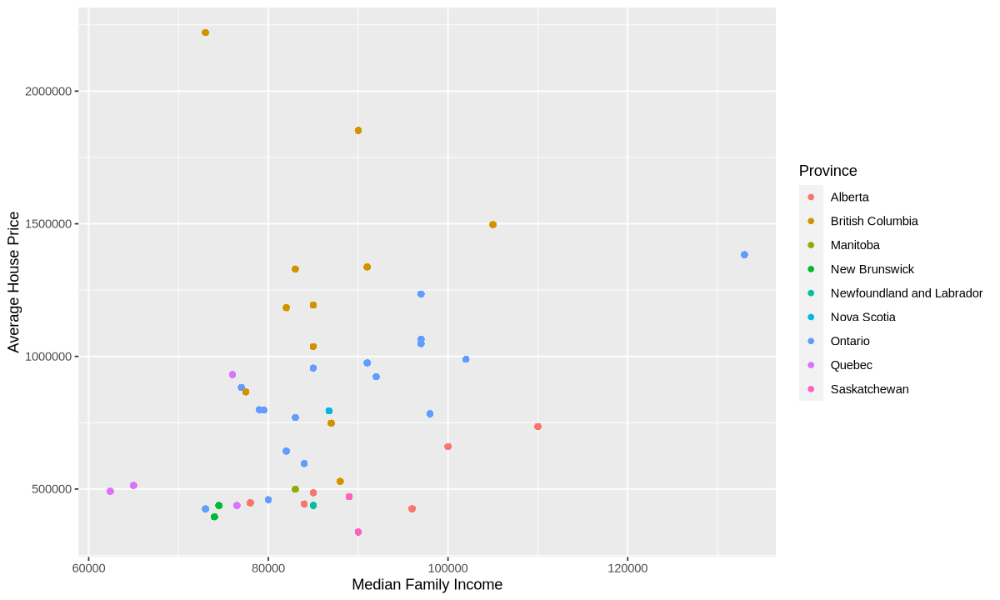

In [58]:
viz_city <- ggplot(merged_data_city, aes(x = Median_Family_Income, y = avg_price, color = Province)) +
  geom_point()+
  labs(x = "Median Family Income", y = "Average House Price", color = "Province")
options(repr.plot.width = 10, repr.plot.height = 6)

viz_city